# Lab2 - Source Separation

Source separation in audio signal processing refers to the task of isolating individual sound sources from an audio mixture. In real-world recordings, multiple sounds, such as vocals, instruments, and background noise, are typically captured together. Sound separation techniques aim to extract each source as a separate signal, making it easier to analyze, process, or enhance individual components

## Part 1: Classical Methods

In this part, we will implement 3 different methods, such ICA, RPCA, and NMF for diffeent tasks

### ICA (Independent Component Analysis)

`Independent Component Analysis` (ICA) is a classical signal processing technique used for separating a mixture of signals into its independent source components. ICA assumes that the observed audio signals (such as microphone recordings) are <u>linear mixtures of statistically independent source signals</u> (e.g., different speakers or instruments)

ICA attempts to unmix these observations by finding a transformation that makes the separated signals as statistically independent from one another as possible. The typical use case is the "cocktail party problem," where multiple people are speaking simultaneously, and you want to recover each individual speaker from a set of microphone recordings

In [1]:
import matplotlib.pyplot as plt
import librosa
import numpy as np
import IPython.display as ipd
from sklearn.decomposition import FastICA

ICA only works for `stereo` audio. Let's load the stereo file from the dataset folder. This is a 2-channel audio that gets 2 speakers voices mixed. The argument `mono=False` ensures we get both channels

In [2]:
file1 = "./Dataset/ICA/stereo_sample1.wav"

# Load the stereo file
sample1, sr1 = librosa.load(
  file1,
  mono=False,
  sr=None
)

# Display the audio to hear what it sounds like
ipd.display(ipd.Audio(rate=sr1, data=sample1))

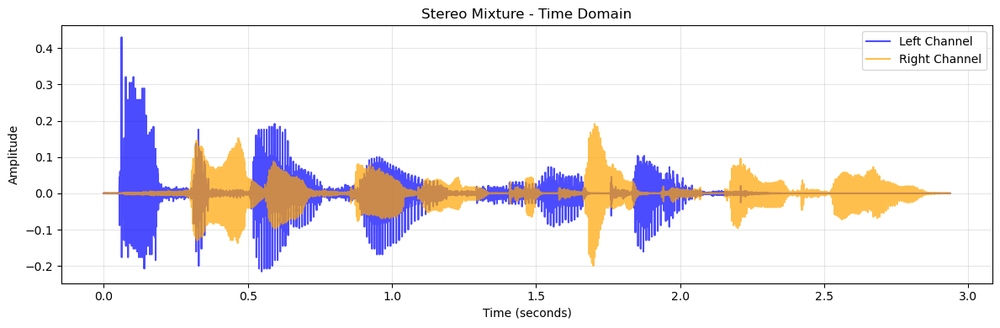

In [3]:
time = np.arange(sample1.shape[1]) / sr1

# Plot both channels
plt.figure(figsize=(12, 4))
plt.plot(time, sample1[0], label='Left Channel', alpha=0.7, color='blue')
plt.plot(time, sample1[1], label='Right Channel', alpha=0.7, color='orange')
plt.xlabel('Time (seconds)')
plt.ylabel('Amplitude')
plt.title('Stereo Mixture - Time Domain')
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

The shape of the varaible `sample1` is `(2, N_samples)`, but the ICA model requires the shape of the input data to be `(N_samples, 2)`

In [4]:
# Transpose the shape to become (N_samples, 2)
X = sample1.T

# Initialize ICA with 2 components (since we have 2 stereo channels)
ica = FastICA(n_components=2)

# Fit ICA and transform the data
ica_fitted = ica.fit_transform(X)  # Shape: (N_samples, 2)

# Transpose back to (2, samples) for saving
separated_sources_ICA = ica_fitted.T  # Shape: (2, N_samples)

Show the first separated source

In [5]:
ipd.Audio(rate=sr1, data=separated_sources_ICA[0])

Show the second separated source

In [6]:
ipd.Audio(rate=sr1, data=separated_sources_ICA[1])

Visualize the results

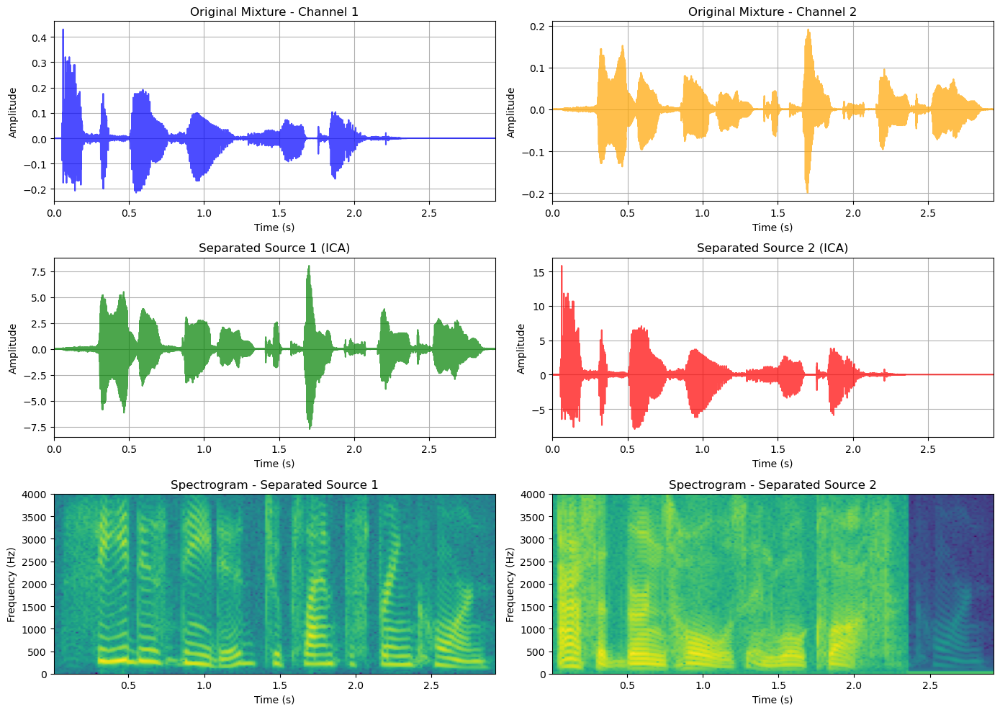

In [7]:
plt.figure(figsize=(14, 10))

time = np.arange(sample1.shape[1]) / sr1 # Time axis
color =['blue', 'orange', 'green', 'red']

for idx in range(2):
  # Original stereo channels (mixtures)
  plt.subplot(3, 2, idx+1)
  plt.plot(time, sample1[idx], color=color[idx], alpha=0.7)
  plt.title(f'Original Mixture - Channel {idx+1}')
  plt.xlabel('Time (s)')
  plt.ylabel('Amplitude')
  plt.grid()
  plt.xlim(0, time[-1])

  # Separated sources (ICA output)
  plt.subplot(3, 2, idx+3)
  plt.plot(time, separated_sources_ICA[idx], color=color[idx+2], alpha=0.7)
  plt.title(f'Separated Source {idx+1} (ICA)')
  plt.xlabel('Time (s)')
  plt.ylabel('Amplitude')
  plt.grid()
  plt.xlim(0, time[-1])

  # Spectrograms of separated sources
  plt.subplot(3, 2, idx+5)
  plt.specgram(separated_sources_ICA[idx], Fs=sr1, cmap='viridis')
  plt.title(f'Spectrogram - Separated Source {idx+1}')
  plt.xlabel('Time (s)')
  plt.ylabel('Frequency (Hz)')

plt.tight_layout()
plt.show();

We can make a 3-channel audio by linearly stacking 3 separate audios together and use `FastICA` to separate them

In [8]:
def make_stereo(audio_paths, mix_matrix, sr=None):
  audios = []
  rates = []

  for path in audio_paths:
    audio, rate = librosa.load(path, sr=sr, mono=True)
    audios.append(audio)
    rates.append(rate)
  
  # Check sample rates
  if sr is None and not all(r == rates[0] for r in rates):
    raise ValueError("Sample rates must match. Set sr to fixed value if needed.")

  # Pad or trim to same length
  max_len = max(len(a) for a in audios)
  audios_equal = [np.pad(a, (0, max_len - len(a)), 'constant') if len(a) < max_len else a[:max_len] for a in audios]
  
  stacked_audio = np.stack(audios_equal, axis=-1)  # shape (num_samples, num_channels)

  # Check mix_matrix shape
  num_channels = len(audio_paths)
  if mix_matrix.shape[1] != num_channels:
    raise ValueError(f"mix_matrix should have {num_channels} columns.")

  # Apply mixing: mixes = stacked_audio @ mix_matrix.T
  mixes = np.dot(stacked_audio, mix_matrix.T)  # shape (num_samples, num_mixes)

  return mixes.T, rates[0] if sr is None else sr

In [9]:
audio_paths = [
  "./Dataset/ICA/spc1.wav",
  "./Dataset/ICA/spc2.wav",
  "./Dataset/ICA/spc3.wav"
]

# Simulating 3 microphones using a matrix
mix_matrix = np.array([
  [0.8, 0.1, 0.1],   # 80% of frist + 10% of second + 10% of third
  [0.2, 0.7, 0.1],   # 20% of first + 70% of second + 10% of third
  [0.1, 0.2, 0.7]    # 10% of first + 20% of second + 70% of third
])

sr = 8000

mixture_X, _ = make_stereo(audio_paths, mix_matrix, sr)

In [10]:
# Initialize ICA with 3 components
ica2 = FastICA(n_components=3)

# Fit ICA and transform the data
ica2_fitted = ica2.fit_transform(mixture_X.T)  # Shape: (n_samples, 3)

# Transpose back to (3, samples) for saving
separated_sources_ICA2 = ica2_fitted.T  # Shape: (3, n_samples)

Display the mixture audio first

In [11]:
ipd.Audio(data=mixture_X, rate=sr)

Display the separated audio one by one

In [12]:
ipd.Audio(data=separated_sources_ICA2[0], rate=sr)

In [13]:
ipd.Audio(data=separated_sources_ICA2[1], rate=sr)

In [14]:
ipd.Audio(data=separated_sources_ICA2[2], rate=sr)

### Robust PCA (RPCA)

RPCA is most used in <u>vocal/accompaniment separation</u> from music recordings. It decomposes a matrix (typically a <u>**spectrogram**</u>) into two parts:
1. `Low-rank component (L)`: The part of the matrix that can be represented by a small number of basis vectors. In music, this usually corresponds to the accompaniment/background, which is repetitive or harmonically simple
2. `Sparse component (S)`: The part with few nonzero entries. In music, this often captures vocals or foreground events (e.g., a melody, transient sounds)

In [35]:
# Load the sample music
file2 = "./Dataset/RPCA/music_sample2.mp3"

sample2, sr2 = librosa.load(
  file2,
  mono=True,
  sr=None,
  # offset=10.0,
  duration=5.0
)

ipd.Audio(data=sample2, rate=sr2)

In [20]:
import math
from numpy.linalg import norm, svd

def RPCA(X, lmbda=.01, tol=1e-7, maxiter=1000, verbose=True):
  Y = X
  norm_two = norm(Y.ravel(), 2)
  norm_inf = norm(Y.ravel(), np.inf) / lmbda
  dual_norm = np.max([norm_two, norm_inf])

  Y = Y / dual_norm
  A = np.zeros(Y.shape)
  E = np.zeros(Y.shape)
  dnorm = norm(X, 'fro')

  mu = 1.25 / norm_two
  rho = 1.5
  sv = 10.
  n = Y.shape[0]
  itr = 0

  while True:
    Eraw = X - A + (1 / mu) * Y
    Eupdate = np.maximum(Eraw - lmbda / mu, 0) + np.minimum(Eraw + lmbda / mu, 0)

    U, S, V = svd(X - Eupdate + (1 / mu) * Y, full_matrices=False)

    svp = (S > 1 / mu).shape[0]
    if svp < sv:
      sv = np.min([svp + 1, n])
    else:
      sv = np.min([svp + round(.05 * n), n])
    Aupdate = np.dot(np.dot(U[:, :svp], np.diag(S[:svp] - 1 / mu)), V[:svp, :])

    A = Aupdate
    E = Eupdate
    Z = X - A - E
    Y = Y + mu * Z

    mu = np.min([mu * rho, mu * 1e7])
    itr += 1
    if ((norm(Z, 'fro') / dnorm) < tol) or (itr >= maxiter):
      break

  if verbose:
    print("Finished at iteration %d" % (itr))  

  return A, E

def singing_voice_separation(X, lmbda=1, nFFT=2048, hopLength=512, gain=1.5, power=1):
  scf = 2 / 3.0
  S_mix = scf * librosa.stft(X, n_fft=nFFT, hop_length=hopLength)  # short-time Fourier transform

  A_mag, E_mag = RPCA(np.power(np.abs(S_mix), power), lmbda=lmbda / math.sqrt(max(S_mix.shape)))
  PHASE = np.angle(S_mix)

  A = A_mag * np.exp(1j * PHASE)
  E = E_mag * np.exp(1j * PHASE)

  mask = np.abs(E) > (gain * np.abs(A))
  Emask = mask * S_mix
  Amask = S_mix - Emask

  wavoutE = librosa.istft(Emask, hop_length=hopLength)
  wavoutA = librosa.istft(Amask, hop_length=hopLength)

  wavoutE /= np.abs(wavoutE).max()
  wavoutA /= np.abs(wavoutA).max()

  return np.array([wavoutE, wavoutA])

In the code above, the variables `A` and `E` represent **low-rank matrix (accompaniment/background)** and **sparse matrix (singing voice/foreground)**

In [36]:
# Apply RPCA
lmbda = 1
nFFT = 4096
hopLength = int(nFFT / 4)

separated_sources_RPCA = singing_voice_separation(
  sample2,
  lmbda=lmbda,
  nFFT=nFFT,
  hopLength=hopLength
)

Finished at iteration 47


In [37]:
# Play the separated source 1
ipd.Audio(data=separated_sources_RPCA[0], rate=sr2)

In [38]:
# Play the separated source 2
ipd.Audio(data=separated_sources_RPCA[1], rate=sr2)

Visualize the spectrogram of two separated sources

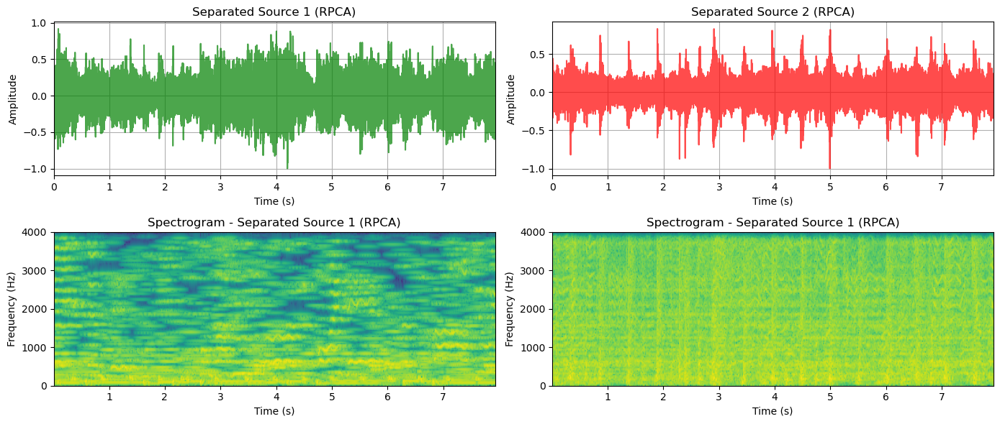

In [27]:
plt.figure(figsize=(14, 6))

time = np.arange(separated_sources_RPCA[0].shape[0]) / sr2
color = ['green', 'red']

for idx, src in enumerate(separated_sources_RPCA):
  # Separated sources (ICA output)
  plt.subplot(2, 2, idx+1)
  plt.plot(time, src, color=color[idx], alpha=0.7)
  plt.title(f'Separated Source {idx+1} (RPCA)')
  plt.xlabel('Time (s)')
  plt.ylabel('Amplitude')
  plt.grid()
  plt.xlim(0, time[-1])

  plt.subplot(2, 2, idx+3)
  plt.specgram(src, Fs=sr2, cmap='viridis')
  plt.title('Spectrogram - Separated Source 1 (RPCA)')
  plt.xlabel('Time (s)')
  plt.ylabel('Frequency (Hz)')

plt.tight_layout()
plt.show();

## Part 2: Deep Learning methods

In this part, we will introduce 3 different network for source separation:
- Con-TasNet
- DPRNN
- Demucs

### Conv-TasNet (Time-domain Audio Separation Network)

`Conv-TasNet` is a deep learning model designed for separating speech sources from a mixture of audio signals. Unlike older methods that use frequency-domain features (like spectrograms), Conv-TasNet works directly with the raw audio waveform. It uses a series of convolutional layers to encode, process, and decode the audio, allowing it to separate different voices very effectively

You can read the paper from: https://arxiv.org/pdf/1809

<img src="Images/Conv-TasNet.jpeg" width=800 alt="Conv-TasNet Architecture" />

There are two options to load the model:
- `ConvTasNet` model. This is the raw model that hasn't been trained. If we need to train our own model, we can use this
- `CONVTASNET_BASE_LIBRI2MIX` pipeline. This is a <u>**pre-train**</u> speech separation model pipeline. The weights were pretrained on dataset `Libri2Mix` at the sample rate <u>**8000 Hz**</u>


In [7]:
import torch
# from torchaudio.models import ConvTasNet
from torchaudio.pipelines import CONVTASNET_BASE_LIBRI2MIX

Since the Conv-TasNet was pre-trained at the sample rate <u>**8000 Hz**</u>, we need to manually set the parameter `sr` as `8000` when using librosa. Otherwise, the separated results are not ideal. The original music sample is a stereo audio, the Conv-TasNet receive a single-channel audio file, so we also need to set the parameter `mono` as `True`

In [42]:
file3 = "./Dataset/ICA/stereo_sample1.wav"

# load the audio at sample rate 8000 Hz
sample3, sr3 = librosa.load(
  file3,
  sr=8000,
  mono=True
)

ipd.Audio(data=sample3, rate=sr3) # hear what it sounds like

Separate the audio using the `CONVTASNET_BASE_LIBRI2MIX` pipeline and plot the result

>Before feeding the data to the model for the separation, we need to do some data transformation, so that the data format satisfies the input of the network. We use pytorch, so we create a tensor. Then we reshape the data to format of `(batch_size, channels, n_features)`.

In [43]:
sample_tensor = torch.from_numpy(sample3).float() # Conver numpy array to torch tensor
sample_tensor = sample_tensor.unsqueeze(0).unsqueeze(0) # Conver to the shape (1, 1, n_features) that pytorch requires

con_tasnet = CONVTASNET_BASE_LIBRI2MIX.get_model() # Load the pre-trained model
con_tasnet.eval() # set the model as evaluation mode

with torch.no_grad():
  separated_sources_TasNet = con_tasnet(sample_tensor).squeeze(0) # Conver the shape to (n_sources, n_features)

Listen the separated sounds and plot the their spectrogram

Separated Source 1


Separated Source 2


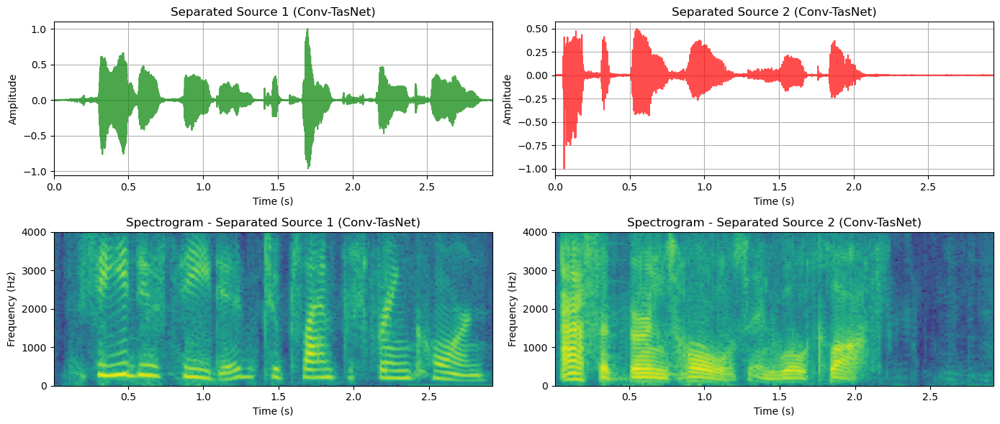

In [44]:
# Listen the separated sources
for idx, src in enumerate(separated_sources_TasNet):
  print(f"Separated Source {idx+1}")
  ipd.display(ipd.Audio(src, rate=sr3))

# Plot the waveform
plt.figure(figsize=(14, 6))
color = ['green', 'red']
for idx, src in enumerate(separated_sources_TasNet):
  time = torch.arange(src.shape[0]) / sr3
  src = src / torch.max(torch.abs(src)) # Normalize to [-1, 1]
  
  plt.subplot(2, 2, idx+1)
  plt.plot(time, src, color=color[idx], alpha=0.7)
  plt.title(f"Separated Source {idx+1} (Conv-TasNet)")
  plt.xlabel('Time (s)')
  plt.ylabel('Amplitude')
  plt.grid()
  plt.xlim(0, time[-1])

  plt.subplot(2, 2, idx+3)
  plt.specgram(src, Fs=sr3, cmap='viridis')
  plt.title(f'Spectrogram - Separated Source {idx + 1} (Conv-TasNet)')
  plt.xlabel('Time (s)')
  plt.ylabel('Frequency (Hz)')

plt.tight_layout()
plt.show()

### Evaluation Metrics

#### SDR / SIR / SAR

To tell how good a model separeted audio sources, let's introduce the following two metrics:
- `SDR (Signal-to-Distortion Ratio)`. How much of the original (target) signal is preserved in the estimated signal, compared to how much unwanted distortion is present
- `SIR (Source-to-Interference Ratio)`. How much of the desired source remains in the estimate compared to the amount of interference from other unwanted sources
- `SAR (Source to Artifacts Ratios)`. How much of the desired signal is present compared to algorithmic artifacts (unnatural distortions, not present in any source)

If these 3 metrics are all higher, that means the separation is good

We can simply import the library `mir_eavl` to get these 3 values. Let's take the original audio `stereo_sample1.wav` we loaded before as the reference audio, and the sources separated by the methods ICA and Conv-TasNet as two different estimated audio. Then, see which method results in high metric values

In [13]:
import mir_eval

Prepare the reference and the estimated audio. Then convert the `estimated_RPCA` and `estimated_TasNet` to 1D shape

In [14]:
file3 = "./Dataset/ICA/stereo_sample1.wav"

# load the audio at sample rate 8000 Hz
sample3, sr3 = librosa.load(
  file3,
  sr=8000,
  mono=True
)

reference = np.array(sample3) # shape (n_samples)
estimated_ICA = np.array(separated_sources_ICA)  # shape (2, n_samples)
estimated_TasNet = np.array(separated_sources_TasNet) # shape (2, n_samples)

estimated_ICA = np.mean(estimated_ICA, axis=0) # shape (n_samples)
estimated_TasNet = np.mean(estimated_TasNet, axis=0) # shape (n_samples)

Calculate these 3 metric value for the `ICA` results

In [15]:
import warnings

warnings.simplefilter("ignore")
sdr_ICA, sir_ICA, sar_ICA, _ = mir_eval.separation.bss_eval_sources(
  reference,
  estimated_ICA
)

print("RPCA")
print("SDR:", sdr_ICA)
print("SIR:", sir_ICA)
print("SAR:", sar_ICA)

RPCA
SDR: [28.36595071]
SIR: [inf]
SAR: [28.36595071]


Calculate these 3 metric values for the `Conv-TasNet` results

In [16]:
sdr_TasNet, sir_TasNet, sar_TasNet, _ = mir_eval.separation.bss_eval_sources(
  reference,
  estimated_TasNet
)

print("TasNet")
print("SDR:", sdr_TasNet)
print("SIR:", sir_TasNet)
print("SAR:", sar_TasNet)

TasNet
SDR: [34.53573043]
SIR: [inf]
SAR: [34.53573043]


#### SI-SDR (Scale-Invariant Signal-to-Distortion Ratio)

The metric SDR is sensitive to the volume of the estimated signal. `SI-SDR` also measures similarity, but ignores any difference in volume (scale) by projecting the estimate onto the best possible scaled version of the target signal before calculating the ratio

In [17]:
# Scale-Invariant Signal-to-Distortion Ratio
def metric_sisdr(reference, estimated, eps=1e-10):
  """
  Argument setup:
  reference: np.ndarray - shape (n_features)
  estimated: np.ndarray - shape (n_features)
  """

  if reference.ndim != estimated.ndim:
    print("The dimension of reference and estimation must be the same")

  # Ensure same length
  n = min(len(reference), len(estimated))
  ref = reference[:n]
  est = estimated[:n]

  # Normalize to [-1, 1]
  ref = ref / np.max(np.abs(ref))
  est = est / np.max(np.abs(est))

  # Projection
  alpha = np.dot(est, ref) / (np.dot(ref, ref) + eps)
  target = alpha * ref
  distortion = est - target

  return 10 * np.log10(np.sum(target**2) / (np.sum(distortion**2) + eps))

In [19]:
sisdr_RPAC = metric_sisdr(
  reference,
  estimated_ICA
)

sisdr_TasNet = metric_sisdr(
  reference,
  estimated_TasNet
)

print("RPCA")
print(f"{sisdr_RPAC:.4f}")

print("\nConv-TasNet")
print(f"{sisdr_TasNet:.4f}")

RPCA
26.4489

Conv-TasNet
33.6363


### DEMUCS

`DEMUCS` is a state-of-the-art music source separation model developed by Meta AI Research (and currently maintained via PyPI demucs) that uses deep learning to split audio tracks into individual stems like vocals, drums, bass, and melody

It takes a mixed audio track as input and predicts each instrument or sound source as a separate audio track, operating directly on audio waveforms (not spectrograms), using an encoder-decoder architecture with convolutional layers and LSTM layers

You can read the paper from: https://arxiv.org/pdf/1911.13254

<img src="./Images/DEMUCS.png" width=1000 />

Run the folloiwng command to install the package `demucs`

>pip install demucs

In [39]:
from demucs.pretrained import get_model
from demucs.apply import apply_model
import torchaudio
import torch

DEMUCS is specifically designed to work with `stereo (two-channel)` audio because most music is in stereo. The model expects stereo inputs to take advantage of the spatial information present in both channels, which helps it separate sources more effectively. Therefore, if we use `librosa` to load the audio, we must set the parameter `mono` as `False`. 

DEMUCS is usually trained and evaluated at a sample rate of `44100` Hz, which is standard CD-quality audio. Most music datasets (like MUSDB18) are at this rate. For best performance, we should also set the parameter `sr` as 44100 manually if `librosa` is used

Let's use the sample audio file `falcon69.mp3` as the example, this sample is from the dataset MUSDB18

In [40]:
file4 = "./Dataset/falcon69.mp3"
# song, sr4 = torchaudio.load(file4)
song, sr4 = librosa.load(
  file4,
  mono=False, # set "mono" as False and sample rate as 44100 manually
  sr=44100,
  duration=10.0
)

Alternately, we can use `torchaudio` to load the audio, and it returns the native sample rate of the file and the number of channels

In [ ]:
# song, sr4 = torchaudio.load(file4)

In [41]:
ipd.Audio(data=song, rate=sr4)

If `librosa` is used, we should convert the loaded sample array to tensor so that it can be fed to the DEMUCS model

In [42]:
# Conver the numpy array to torch tensor
if isinstance(song, np.ndarray):
  song_tensor = torch.from_numpy(song)
  song_tensor = song_tensor.unsqueeze(0)

In [46]:
# Load model
DEMUCS = get_model('htdemucs')
DEMUCS.eval();

# Separate
with torch.no_grad():
  sources_demucs = apply_model(DEMUCS, song_tensor.cuda(), split=True)[0]
  sources_demucs = sources_demucs.cpu().numpy() # convert to numpy array

Visualize the results

drums


bass


melody


vocals


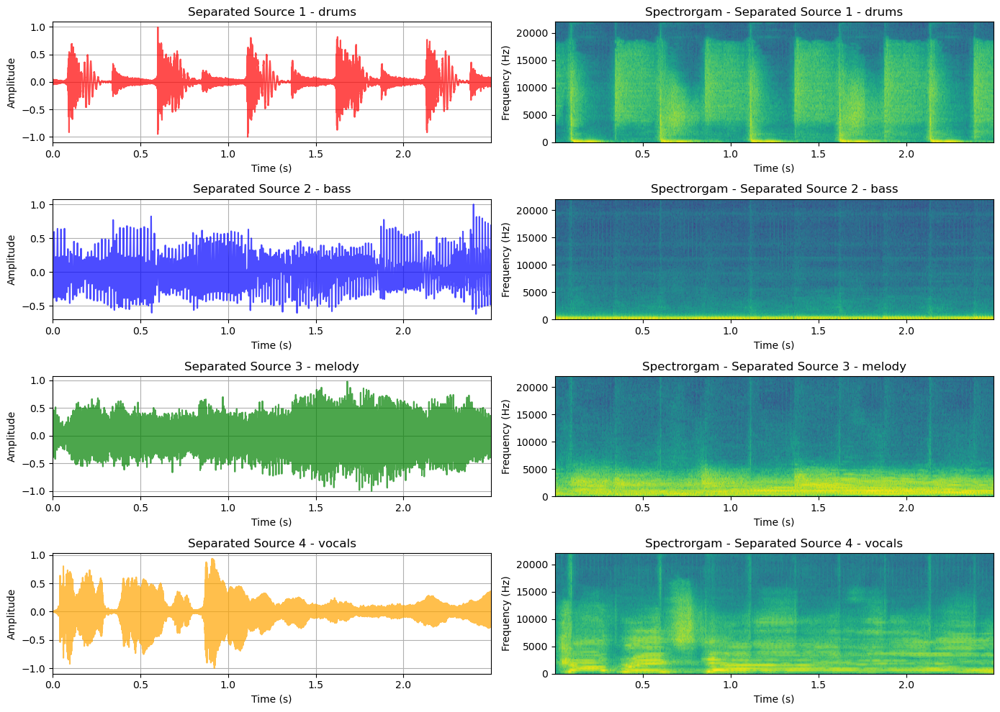

In [47]:
stems = ['drums', 'bass', 'melody', 'vocals']
color = ['red', 'blue', 'green', 'orange']

plt.figure(figsize=(14, 10))
for i, s in enumerate(stems):
  print(s)
  ipd.display(ipd.Audio(data=sources_demucs[i], rate=sr4))

  src = np.mean(sources_demucs[i], axis=0)
  length = min(200000, int(len(src) / 4))
  src = src[:length]
  time = np.arange(src.shape[0]) / sr4
  src = src / np.max(np.abs(src)) # Normalize to [-1, 1]

  plt.subplot(4, 2, i * 2 + 1)
  plt.plot(time, src, color=color[i], alpha=0.7)
  plt.title(f"Separated Source {i + 1} - {stems[i]}")
  plt.xlabel("Time (s)")
  plt.ylabel("Amplitude")
  plt.grid()
  plt.xlim(0, time[-1])

  plt.subplot(4, 2, i * 2 + 2)
  plt.specgram(src, Fs=sr4, cmap='viridis')
  plt.title(f"Spectrorgam - Separated Source {i + 1} - {stems[i]}")
  plt.xlabel("Time (s)")
  plt.ylabel("Frequency (Hz)")

plt.tight_layout()
plt.show()

Calculate SDR, SIR, SAR, and SI-SDR

In [48]:
import mir_eval
import warnings

estimated_song = sources_demucs.mean(axis=0)

warnings.simplefilter('ignore')
sdr_DEMUCS, sir_DEMUCS, sar_DEMUCS, _ = mir_eval.separation.bss_eval_sources(
  song,
  estimated_song
)

sisdr_DEMUCS = metric_sisdr(
  song.mean(axis=0),
  estimated_song.mean(axis=0)
)

print("SDR:", sdr_DEMUCS)
print("SIR:", sir_DEMUCS)
print("SAR:", sar_DEMUCS)
print("SISR:", sisdr_DEMUCS)

SDR: [31.5197909  31.86982221]
SIR: [47.68233397 47.77421852]
SAR: [31.62623954 31.98286941]
SISR: 32.06045492290115


### DPRNN

`DPRNN` stands for **Dual-Path Recurrent Neural Network**. It was proposed for single-channel speech separation, enabling learning to "unmix" multiple speakers from a single microphone waveform

You can read the paper from: https://arxiv.org/pdf/1910.06379

<img src="./Images/DPRNN.png" width=1500 />

In [4]:
import torch.nn as nn
import torch

class DPRNNBlock(nn.Module):
  def __init__(self, input_size, hidden_size, chunk_size):
    super(DPRNNBlock, self).__init__()
    self.chunk_size = chunk_size
    self.intra_rnn = nn.LSTM(input_size, hidden_size, batch_first=True, bidirectional=True)
    self.intra_linear = nn.Linear(hidden_size * 2, input_size)
    self.intra_norm = nn.LayerNorm(input_size)

    self.inter_rnn = nn.LSTM(input_size, hidden_size, batch_first=True, bidirectional=True)
    self.inter_linear = nn.Linear(hidden_size * 2, input_size)
    self.inter_norm = nn.LayerNorm(input_size)

  def forward(self, x):
    # x: [batch, seq_len, feature_dim]
    B, T, F = x.size()
    # Chunking
    P = self.chunk_size
    num_chunks = (T + P - 1) // P  # ceil division
    pad_len = num_chunks * P - T
    if pad_len > 0:
      x = torch.cat([x, torch.zeros(B, pad_len, F, device=x.device)], dim=1)
    x = x.view(B, num_chunks, P, F)  # [B, num_chunks, chunk_size, F]

    # Intra-chunk RNN
    x_intra = x.contiguous().view(B * num_chunks, P, F)
    x_intra, _ = self.intra_rnn(x_intra)
    x_intra = self.intra_linear(x_intra)
    x_intra = self.intra_norm(x_intra)
    x_intra = x_intra + x.contiguous().view(B * num_chunks, P, F)  # Residual
    x_intra = x_intra.view(B, num_chunks, P, F)

    # Permute for inter-chunk RNN: [B, chunk_size, num_chunks, F]
    x_inter = x_intra.permute(0, 2, 1, 3).contiguous()
    x_inter = x_inter.view(B * P, num_chunks, F)
    x_inter, _ = self.inter_rnn(x_inter)
    x_inter = self.inter_linear(x_inter)
    x_inter = self.inter_norm(x_inter)
    x_inter = x_inter + x_intra.permute(0, 2, 1, 3).contiguous().view(B * P, num_chunks, F)  # Residual
    x_inter = x_inter.view(B, P, num_chunks, F).permute(0, 2, 1, 3).contiguous()  # [B, num_chunks, P, F]

    # Merge chunks
    x_out = x_inter.view(B, num_chunks * P, F)
    x_out = x_out[:, :T, :]  # remove padding if any
    return x_out

In [2]:
class DPRNN(nn.Module):
  def __init__(self, input_size, hidden_size, chunk_size, num_blocks):
    super(DPRNN, self).__init__()
    self.blocks = nn.ModuleList([
      DPRNNBlock(input_size, hidden_size, chunk_size) for _ in range(num_blocks)
    ])

  def forward(self, x):
    for block in self.blocks:
      x = block(x)
    return x

In [7]:
B, T, F = 2, 100, 64  # batch, seq_len, feature_dim
x = torch.randn(B, T, F)
dprnn = DPRNN(input_size=F, hidden_size=128, chunk_size=10, num_blocks=6)
out = dprnn(x)
print(out.shape)  # [B, T, F]

torch.Size([2, 100, 64])


## Discussion

In the previous sections, we implemented ICA, RPCA, and Conc-TasNet to separate two speaker's voice. If we have an audio that mixes 3 or more speaker's voice, how do we separate their voices?

## Reference
- mixture_stereo: https://www.mmsp.ece.mcgill.ca/Documents/AudioFormats/WAVE/Samples.html
- vocalremover: https://vocalremover.org/
- singing-voice-separation: https://github.com/hiromu/rpca_svs/blob/master/separation.py
- PyTorch-based audio source separation toolkit: https://github.com/asteroid-team/asteroid
- Conv-TasNet: https://github.com/JusperLee/Conv-TasNet
- Conv-TasNet: https://github.com/kaituoxu/Conv-TasNet
- Conv-TasNet: https://www.youtube.com/watch?v=G0O1A7lONSYhttps://www.youtube.com/watch?v=G0O1A7lONSY
- Torchaudio Pipeline - https://docs.pytorch.org/audio/2.2.0/pipelines.html
- MUSDB18 - https://sigsep.github.io/datasets/musdb.html
- LibriSpeech - https://www.openslr.org/12
- Libri2Mix-8kHz - https://www.kaggle.com/datasets/unconscious/libri2mix-8khz-min/data
- https://github.com/markovka17/dla
- DEMUCS - https://github.com/adefossez/demucs
- DEMUCS - https://medium.com/@michaeljornist/understanding-demucs-u-net-architecture-in-an-intuitive-way-9a9a3c16cdd8
- DEMUCS - https://docs.clore.ai/guides/audio-and-voice/demucs-separation
- Hybird DEMUCS - https://arxiv.org/pdf/2211.08553